In [1]:
import osmnx as ox
import numpy as np
import matplotlib.pyplot as plt

## Plotting cycleways

In [2]:
# function to get all cycleways in a city
def get_cycleways(city_name):
    useful_tags = ox.settings.useful_tags_way + ['cycleway']
    ox.config(use_cache=True, log_console=True, useful_tags_way=useful_tags)
    G = ox.graph_from_place(query = city_name, network_type='bike', simplify=False)
    non_cycleways = [(u, v, k) for u, v, k, d in G.edges(keys=True, data=True) if not ('cycleway' in d or d['highway']=='cycleway')]
    G.remove_edges_from(non_cycleways)
    G = ox.utils_graph.remove_isolated_nodes(G)
    return G

In [5]:
# plot cycleways
city_name = 'Amsterdam, Netherlands'
cycleways = get_cycleways(city_name)
ox.plot_graph(cycleways)

## Plotting city area

In [40]:
# get outline of city area
city_area = ox.geocode_to_gdf(city_name)

(560429.3523661878, 612095.8508372464, 4478582.988995567, 4532463.421669499)

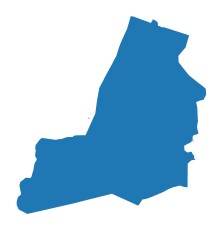

In [41]:
# plot city area
ax = ox.project_gdf(city_area).plot()
ax.axis('off')

## All together in one function

In [3]:
def plot_cycleways(city_name,cycleways,roads,city_area):

    # plot cycleways overlaid city area
    fig, ax = plt.subplots(figsize=(4,4))
    ax.set_title(city_name,fontsize=9)

    city_area.plot(ax=ax, facecolor='gainsboro')
    ox.plot_graph(roads,ax=ax,node_size=0,edge_linewidth=.25,edge_color='dimgrey')
    ox.plot_graph(cycleways,ax=ax,node_size=0,edge_linewidth=.65,edge_color='dodgerblue')

    ax.axis('off')

    return fig

In [5]:
city_name = 'Amsterdam, Netherlands'
# get cycleways 
cycleways = get_cycleways(city_name)
# get city area
city_area = ox.geocode_to_gdf(city_name)
# get roads
roads = ox.graph_from_place(city_name,network_type='drive')

In [6]:
%%capture
fig = plot_cycleways(city_name,cycleways,roads,city_area)
fig.savefig(f'examples/{city_name}.pdf',dpi=1000)

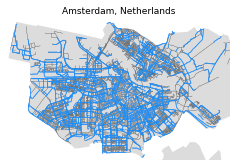

In [7]:
fig